In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from spectral.io import envi

import os

from isofit.configs import configs
from isofit.utils.surface_model import surface_model
from isofit.core.forward import ForwardModel
from isofit.core.fileio import IO
from isofit.inversion.inverse import Inversion
from isofit.core.geometry import Geometry
from isofit.inversion.inverse_simple import invert_simple, invert_liquid_water, heuristic_atmosphere

plt.rcParams['figure.dpi'] = 300

## 1. Prior Library Modifications

In [18]:
working_folder = '.'

surfaces_folder = os.path.join(working_folder, 'data/surfaces')

# EMIT libraries for vegetation and soil 
# Pulled from https://github.com/emit-sds/emit-sds-l2a
veg_prior_block_path = os.path.join(surfaces_folder, 'filtered_veg.hdr')
veg_prior_block = envi.open(veg_prior_block_path).load()
soil_prior_block_path = os.path.join(surfaces_folder, 'filtered_other.hdr')  
soil_prior_block = envi.open(soil_prior_block_path).load()

# "Dry" vegetation spectra -- water removed from 775-1300nm using Beer-Lambert model
# Extinction coefficients pulled from Kedenburg et al. 2012 (https://doi.org/10.1364/OME.2.001588)
veg_dry_prior_block_path = os.path.join(surfaces_folder, 'filtered_veg_dry.hdr')
veg_dry_prior_block = envi.open(veg_dry_prior_block_path).load()

# Mixtures of dry vegetation and soil + normal vegetation and soil
# Generated using a Latin hypercube sampling of potential endmembers + a linear fractional cover
mixtures_prior_block_path = os.path.join(surfaces_folder, 'mixtures.hdr')
mixtures_prior_block = envi.open(mixtures_prior_block_path).load()
mixtures_dry_prior_block_path = os.path.join(surfaces_folder, 'mixtures_dry.hdr')
mixtures_dry_prior_block = envi.open(mixtures_dry_prior_block_path).load()

In [19]:
wl = np.array(veg_prior_block.bands.centers)

def closest_wl(mv):
    return np.argmin(np.abs(wl-mv))
wl_nan = wl.copy()
wl_nan[closest_wl(1300):closest_wl(1410)] = np.nan
wl_nan[closest_wl(1800):closest_wl(1970)] = np.nan

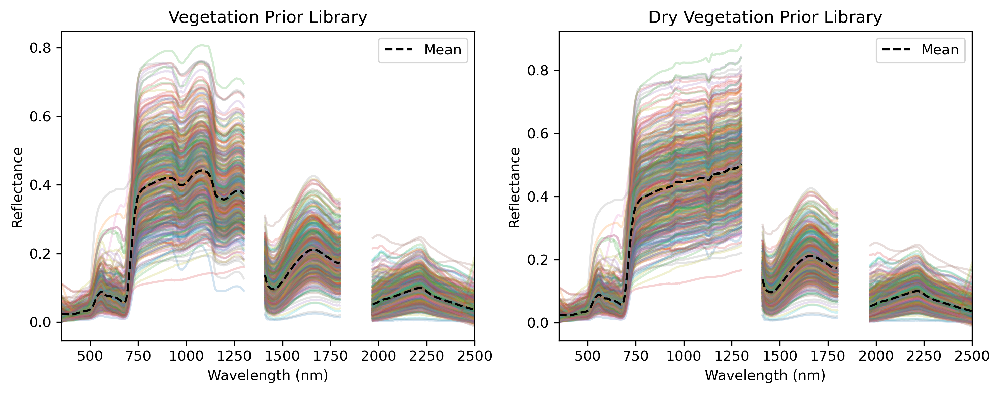

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Vegetation priors
for i in range(veg_prior_block.shape[0]):
    this_spec = veg_prior_block[i, 0, :].squeeze()
    axs[0].plot(wl_nan, this_spec, alpha = 0.2)
veg_mean = np.nanmean(veg_prior_block[:, 0, :], axis=0).squeeze()
axs[0].plot(wl_nan, veg_mean, color='black', linestyle='--', label='Mean')
axs[0].set_title('Vegetation Prior Library')
axs[0].set_xlabel('Wavelength (nm)')
axs[0].set_ylabel('Reflectance')
axs[0].set_xlim([wl[0], wl[-1]])
axs[0].legend()

# "Dry" vegetation priors
for i in range(veg_dry_prior_block.shape[0]):
    this_spec = veg_dry_prior_block[i, 0, :].squeeze()
    axs[1].plot(wl_nan, this_spec, alpha = 0.2)
veg_dry_mean = np.nanmean(veg_dry_prior_block[:, 0, :], axis=0).squeeze()
axs[1].plot(wl_nan, veg_dry_mean, color='black', linestyle='--', label='Mean')
axs[1].set_title('Dry Vegetation Prior Library')
axs[1].set_xlabel('Wavelength (nm)')
axs[1].set_ylabel('Reflectance')
axs[1].set_xlim([wl[0], wl[-1]])
axs[1].legend()

plt.tight_layout()
plt.show()

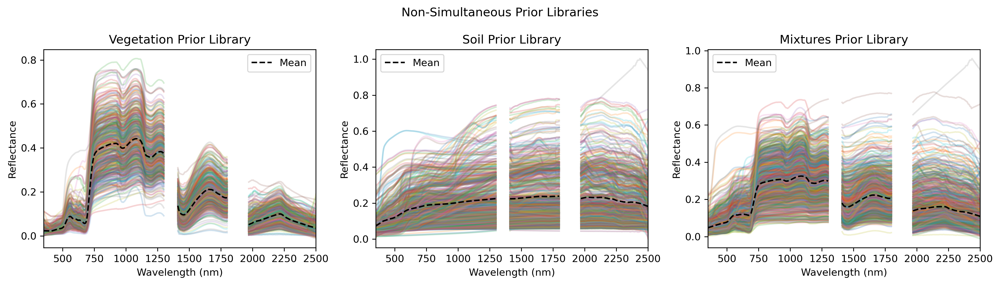

In [21]:
fig, axs = plt.subplots(1, 3, figsize=(14, 4))

# Vegetation priors
for i in range(veg_prior_block.shape[0]):
    this_spec = veg_prior_block[i, 0, :].squeeze()
    axs[0].plot(wl_nan, this_spec, alpha = 0.2)
veg_mean = np.nanmean(veg_prior_block[:, 0, :], axis=0).squeeze()
axs[0].plot(wl_nan, veg_mean, color='black', linestyle='--', label='Mean')
axs[0].set_title('Vegetation Prior Library')
axs[0].set_xlabel('Wavelength (nm)')
axs[0].set_ylabel('Reflectance')
axs[0].set_xlim([wl[0], wl[-1]])
axs[0].legend()

# Soil priors
for i in range(soil_prior_block.shape[0]):
    this_spec = soil_prior_block[i, 0, :].squeeze()
    axs[1].plot(wl_nan, this_spec, alpha = 0.2)
soil_mean = np.nanmean(soil_prior_block[:, 0, :], axis=0).squeeze()
axs[1].plot(wl_nan, soil_mean, color='black', linestyle='--', label='Mean')
axs[1].set_title('Soil Prior Library')
axs[1].set_xlabel('Wavelength (nm)')
axs[1].set_ylabel('Reflectance')
axs[1].set_xlim([wl[0], wl[-1]])
axs[1].legend()

# Mixtures priors
for i in range(mixtures_prior_block.shape[0]):
    this_spec = mixtures_prior_block[i, 0, :].squeeze()
    axs[2].plot(wl_nan, this_spec, alpha = 0.2)
mixtures_mean = np.nanmean(mixtures_prior_block[:, 0, :], axis=0).squeeze()
axs[2].plot(wl_nan, mixtures_mean, color='black', linestyle='--', label='Mean')
axs[2].set_title('Mixtures Prior Library')
axs[2].set_xlabel('Wavelength (nm)')
axs[2].set_ylabel('Reflectance')
axs[2].set_xlim([wl[0], wl[-1]])
axs[2].legend()

fig.suptitle('Non-Simultaneous Prior Libraries')

plt.tight_layout()
plt.show()

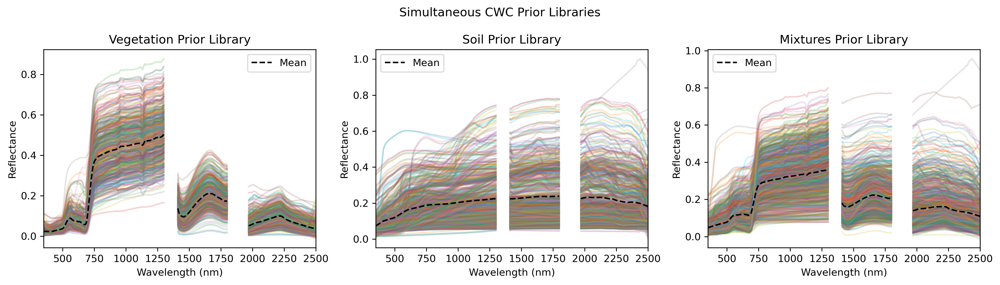

In [22]:
fig, axs = plt.subplots(1, 3, figsize=(14, 4))

# Vegetation priors
for i in range(veg_dry_prior_block.shape[0]):
    this_spec = veg_dry_prior_block[i, 0, :].squeeze()
    axs[0].plot(wl_nan, this_spec, alpha = 0.2)
veg_dry_mean = np.nanmean(veg_dry_prior_block[:, 0, :], axis=0).squeeze()
axs[0].plot(wl_nan, veg_dry_mean, color='black', linestyle='--', label='Mean')
axs[0].set_title('Vegetation Prior Library')
axs[0].set_xlabel('Wavelength (nm)')
axs[0].set_ylabel('Reflectance')
axs[0].set_xlim([wl[0], wl[-1]])
axs[0].legend()

# Soil priors
for i in range(soil_prior_block.shape[0]):
    this_spec = soil_prior_block[i, 0, :].squeeze()
    axs[1].plot(wl_nan, this_spec, alpha = 0.2)
soil_mean = np.nanmean(soil_prior_block[:, 0, :], axis=0).squeeze()
axs[1].plot(wl_nan, soil_mean, color='black', linestyle='--', label='Mean')
axs[1].set_title('Soil Prior Library')
axs[1].set_xlabel('Wavelength (nm)')
axs[1].set_ylabel('Reflectance')
axs[1].set_xlim([wl[0], wl[-1]])
axs[1].legend()

# Mixtures priors
for i in range(mixtures_dry_prior_block.shape[0]):
    this_spec = mixtures_dry_prior_block[i, 0, :].squeeze()
    axs[2].plot(wl_nan, this_spec, alpha = 0.2)
mixtures_mean = np.nanmean(mixtures_dry_prior_block[:, 0, :], axis=0).squeeze()
axs[2].plot(wl_nan, mixtures_mean, color='black', linestyle='--', label='Mean')
axs[2].set_title('Mixtures Prior Library')
axs[2].set_xlabel('Wavelength (nm)')
axs[2].set_ylabel('Reflectance')
axs[2].set_xlim([wl[0], wl[-1]])
axs[2].legend()

fig.suptitle('Simultaneous CWC Prior Libraries')

plt.tight_layout()
plt.show()

## 2. Quick Demo

In [23]:
# Base surface
base_surface_model_path = os.path.join(working_folder, './data/surfaces/surface_model.json')
base_output_surface_file = './data/surfaces/base_surface.mat'

surface_model(**{
    'config_path': base_surface_model_path,
    'output_path': base_output_surface_file,
    'wavelength_path': './data/wl_data.txt'
})

# Dry surface
dry_surface_model_path = os.path.join(working_folder, './data/surfaces/dry_surface_model.json')
dry_output_surface_file = './data/surfaces/dry_surface.mat'

surface_model(**{
    'config_path': dry_surface_model_path,
    'output_path': dry_output_surface_file,
    'wavelength_path': './data/wl_data.txt'
})

0 ['filtered_veg']
0 ['filtered_other']
0 ['mixtures']
1 ['mixtures']
0 ['filtered_veg_dry']
0 ['filtered_other']
0 ['mixtures_dry']
1 ['mixtures_dry']


In [24]:
# Spin up models

# Base case model
base_config_path = os.path.join(working_folder, 'data/config/model_config.json')
base_config = configs.create_new_config(base_config_path)
fm_base = ForwardModel(base_config)
io_base = IO(base_config, fm_base)
inv_base = Inversion(base_config, fm_base)

# Dry model
dry_config_path = os.path.join(working_folder, 'data/config/dry_model_config.json')
dry_config = configs.create_new_config(dry_config_path)
fm_dry = ForwardModel(dry_config)
io_dry = IO(dry_config, fm_dry)
inv_dry = Inversion(dry_config, fm_dry)

In [25]:
wl = io_base.meas_wl
def closest_wl(mv):
    return np.argmin(np.abs(wl-mv))
wl_nan = io_base.meas_wl.copy()
wl_nan[closest_wl(1300):closest_wl(1440)] = np.nan
wl_nan[closest_wl(1770):closest_wl(1965)] = np.nan

In [26]:
# Input data for example case
rdn = np.loadtxt('./data/input/this_rdn.txt', dtype="float32")
obs = np.loadtxt('./data/input/this_obs.txt', dtype="float32")
loc = np.loadtxt('./data/input/this_loc.txt', dtype="float32")

# Package into geometry
geom = Geometry(obs,loc)

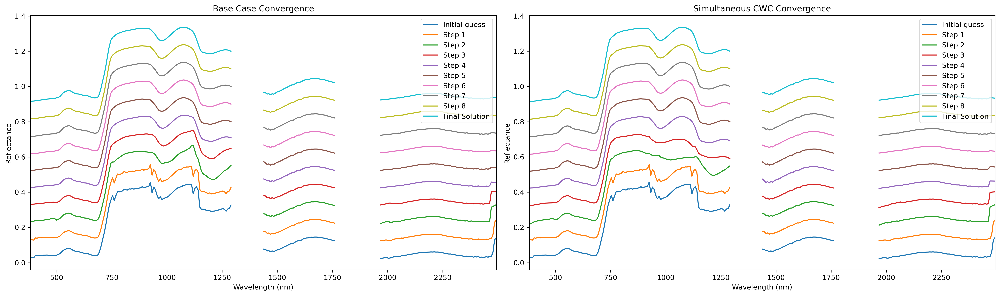

In [27]:
# Run inversions
states = inv_base.invert(rdn, geom)
dry_states = inv_dry.invert(rdn, geom)

# Compare convergences
fig, axs = plt.subplots(1, 2, figsize=(20, 6))

offset = 0
for n in range(0,states.shape[0],1):
    lab = f'Step {n}'
    if n == 0:
        lab = 'Initial guess'
    axs[0].plot(wl_nan, states[n][:-2] + offset, label=lab)
    offset += 0.1
axs[0].plot(wl_nan, states[-1][:-2] + offset, label='Final Solution')
axs[0].set_title('Base Case Convergence')
axs[0].set_xlabel('Wavelength (nm)')
axs[0].set_ylabel('Reflectance')
axs[0].set_xlim(wl[0], wl[-1])
axs[0].legend(loc='upper right')

offset = 0
for n in range(0,dry_states.shape[0],1):
    lab = f'Step {n}'
    if n == 0:
        lab = 'Initial guess'
    axs[1].plot(wl_nan, fm_dry.surface.calc_lamb(dry_states[n,:-2], geom) + offset, label=lab)
    offset += 0.1
axs[1].plot(wl_nan, fm_dry.surface.calc_lamb(dry_states[-1,:-2], geom) + offset, label='Final Solution')
axs[1].set_title('Simultaneous CWC Convergence')
axs[1].set_xlabel('Wavelength (nm)')
axs[1].set_ylabel('Reflectance')
axs[1].set_xlim(wl[0], wl[-1])
axs[1].legend(loc='upper right')

plt.tight_layout()
plt.show()

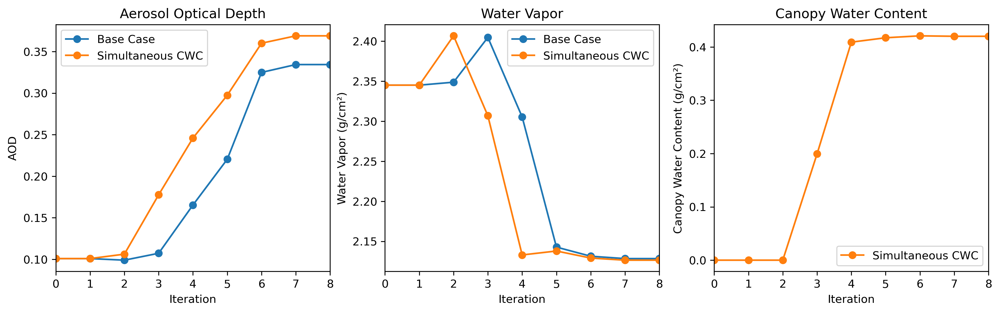

In [28]:
# Radiative transfer outputs + CWC
fig, axs = plt.subplots(1, 3, figsize=(15,4))

# AOD
axs[0].plot(states[:, -2], marker='o', label='Base Case')   
axs[0].plot(dry_states[:, -2], marker='o', label='Simultaneous CWC')
axs[0].set_title('Aerosol Optical Depth')
axs[0].set_xlabel('Iteration')
axs[0].set_ylabel('AOD')
axs[0].set_xlim([0, max(states.shape[0], dry_states.shape[0])-1])
axs[0].legend()

# Water Vapor
axs[1].plot(states[:, -1], marker='o', label='Base Case')
axs[1].plot(dry_states[:, -1], marker='o', label='Simultaneous CWC')
axs[1].set_title('Water Vapor')
axs[1].set_xlabel('Iteration')
axs[1].set_ylabel('Water Vapor (g/cm²)')
axs[1].set_xlim([0, max(states.shape[0], dry_states.shape[0])-1])
axs[1].legend()

# CWC
axs[2].plot(dry_states[:, -3], marker='o', label='Simultaneous CWC', color=u'#ff7f0e')
axs[2].set_title('Canopy Water Content')
axs[2].set_xlabel('Iteration')
axs[2].set_ylabel('Canopy Water Content (g/cm²)')
axs[2].set_xlim([0, dry_states.shape[0]-1])
axs[2].legend()


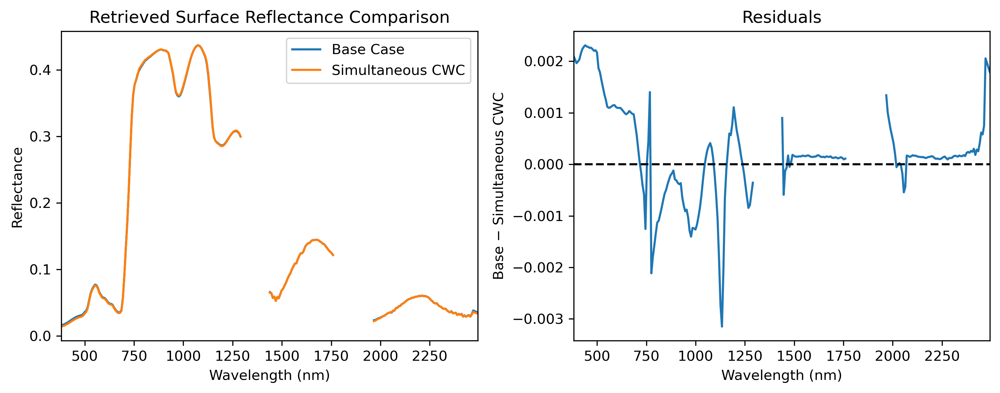

In [29]:
# Comparing final solutions
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Compare the two surface reflectances...
axs[0].plot(wl_nan,states[-1,:-2], label='Base Case')
axs[0].plot(wl_nan,fm_dry.surface.calc_lamb(dry_states[-1,:-2], geom), label='Simultaneous CWC')
axs[0].set_title('Retrieved Surface Reflectance Comparison')
axs[0].set_xlabel('Wavelength (nm)')
axs[0].set_ylabel('Reflectance')
axs[0].set_xlim(wl[0], wl[-1])
axs[0].legend()

# Residual plot
axs[1].plot(wl_nan,states[-1,:-2]-fm_dry.surface.calc_lamb(dry_states[-1,:-2], geom))
axs[1].axhline(0, color='black', linestyle='--')
axs[1].set_title('Residuals')
axs[1].set_xlabel('Wavelength (nm)')
axs[1].set_ylabel('Base − Simultaneous CWC')
axs[1].set_xlim(wl[0], wl[-1])

plt.tight_layout()
plt.show()

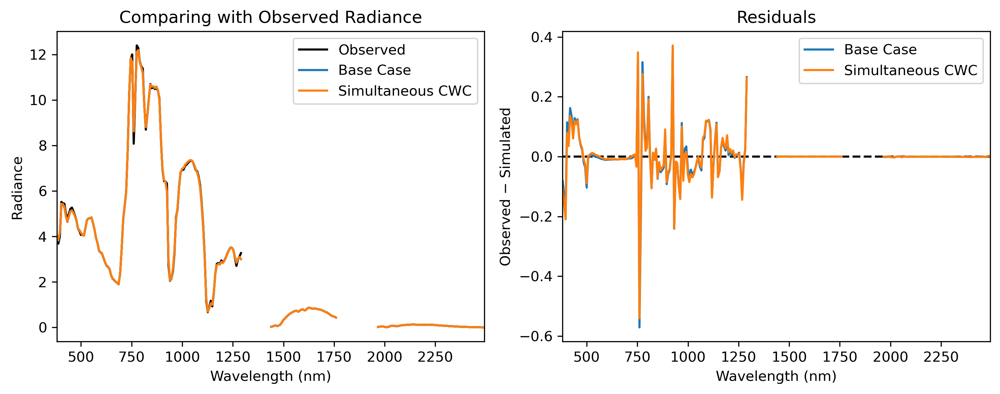

In [30]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

sim_rad = fm_base.calc_rdn(states[-1,:], geom)
dry_sim_rad = fm_dry.calc_rdn(dry_states[-1,:], geom)

# Original radiance
axs[0].plot(wl_nan, rdn, label='Observed', color='black')   
axs[0].plot(wl_nan, sim_rad, label='Base Case')
axs[0].plot(wl_nan, dry_sim_rad, label='Simultaneous CWC')
axs[0].set_title('Comparing with Observed Radiance')
axs[0].set_xlabel('Wavelength (nm)')
axs[0].set_ylabel('Radiance')
axs[0].set_xlim(wl[0], wl[-1])
axs[0].legend()

# Residual
axs[1].axhline(0, color='black', linestyle='--')
axs[1].plot(wl_nan, rdn - sim_rad, label='Base Case')
axs[1].plot(wl_nan, rdn - dry_sim_rad, label='Simultaneous CWC')
axs[1].set_title('Residuals')
axs[1].set_xlabel('Wavelength (nm)')
axs[1].set_ylabel('Observed − Simulated')
axs[1].set_xlim(wl[0], wl[-1])
axs[1].legend()

plt.tight_layout()
plt.show()

(381.00558, 2492.9238)

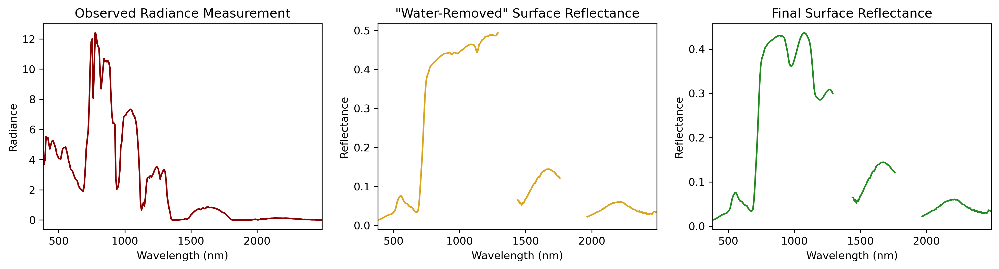

In [31]:
# Plots for concept diagram in paper
fig, axs = plt.subplots(1, 3, figsize=(16, 3.5))

# Radiance
axs[0].plot(wl, rdn, label='Observed', color='darkred')
axs[0].set_title('Observed Radiance Measurement')
axs[0].set_xlabel('Wavelength (nm)')
axs[0].set_ylabel('Radiance')
axs[0].set_xlim(wl[0], wl[-1])

# "Dry" reflectance
axs[1].plot(wl_nan, dry_states[-1,:-3], label='Simultaneous CWC', color='goldenrod')
axs[1].set_title('\"Water-Removed\" Surface Reflectance')
axs[1].set_xlabel('Wavelength (nm)')
axs[1].set_ylabel('Reflectance')
axs[1].set_xlim(wl[0], wl[-1])

# Final surface reflectance
axs[2].plot(wl_nan, fm_dry.surface.calc_lamb(dry_states[-1,:-2], geom), label='Simultaneous CWC', color='forestgreen')
axs[2].set_title('Final Surface Reflectance')
axs[2].set_xlabel('Wavelength (nm)')
axs[2].set_ylabel('Reflectance')
axs[2].set_xlim(wl[0], wl[-1])

In [32]:
print('CWC =', dry_states[-1, -3])
print('AOD =', dry_states[-1, -2])
print('H2O =', dry_states[-1, -1])

CWC = 0.419998674774607
AOD = 0.36891072933581454
H2O = 2.1264876507924266


In [33]:
wl

array([ 381.00558,  388.4092 ,  395.81583,  403.2254 ,  410.638  ,
        418.0536 ,  425.47214,  432.8927 ,  440.31726,  447.7428 ,
        455.17035,  462.59888,  470.0304 ,  477.46292,  484.89743,
        492.33292,  499.77142,  507.2099 ,  514.6504 ,  522.0909 ,
        529.5333 ,  536.9768 ,  544.42126,  551.8667 ,  559.3142 ,
        566.7616 ,  574.20905,  581.6585 ,  589.108  ,  596.55835,
        604.0098 ,  611.4622 ,  618.9146 ,  626.36804,  633.8215 ,
        641.2759 ,  648.7303 ,  656.1857 ,  663.6411 ,  671.09753,
        678.5539 ,  686.0103 ,  693.4677 ,  700.9251 ,  708.38354,
        715.84094,  723.2993 ,  730.7587 ,  738.2171 ,  745.6765 ,
        753.1359 ,  760.5963 ,  768.0557 ,  775.5161 ,  782.97754,
        790.4379 ,  797.89935,  805.36176,  812.8232 ,  820.2846 ,
        827.746  ,  835.2074 ,  842.66986,  850.1313 ,  857.5937 ,
        865.0551 ,  872.5176 ,  879.98004,  887.44147,  894.90393,
        902.3664 ,  909.82886,  917.2913 ,  924.7538 ,  932.21